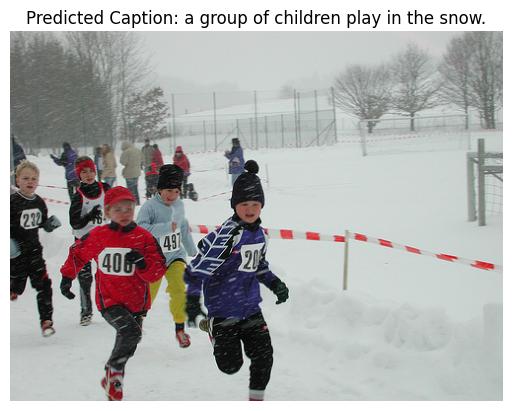

Ground Truth Captions:
1. A group of children run a footrace in the snow .
2. A group of young boys race on a snowy day .
3. School kids racing in the snow .
4. The children are running in the snow with fences in the background .
5. The young runners are racing through the snow .


In [31]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from transformers import BertTokenizer
from torch.nn.utils.rnn import pad_sequence
from torchvision.models import ResNet101_Weights, resnet101


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet101(weights=ResNet101_Weights.DEFAULT)
        self.resnet = nn.Sequential(*list(resnet.children())[:-2])
        # The shape of features: (batch, 2048, 7, 7) after ResNet-101
        self.conv2d = nn.Conv2d(2048, embed_size, kernel_size=1)
        self.bn = nn.BatchNorm2d(embed_size, momentum=0.01)

    def forward(self, images):
        with torch.no_grad():
            features = self.resnet(images)  # (B, 2048, 7, 7)
        features = self.bn(self.conv2d(features))  # (B, embed_size, 7, 7)
        features = features.view(features.size(0), features.size(1), -1)
        features = features.permute(0, 2, 1)
        return features

########################################
# Attention Module
########################################
class Attention(nn.Module):
    def __init__(self, feature_size, hidden_size):
        super(Attention, self).__init__()
        self.attention = nn.Linear(feature_size + hidden_size, hidden_size)
        self.v = nn.Linear(hidden_size, 1)

    def forward(self, features, hidden):
        hidden = hidden.squeeze(0)  
        hidden = hidden.unsqueeze(1).expand_as(features[:, :, :hidden.size(-1)])  
        concat = torch.cat([features, hidden], dim=2)  
        energy = torch.tanh(self.attention(concat))  
        attention = self.v(energy).squeeze(2)  
        alpha = torch.softmax(attention, dim=1)  
        # Weighted sum of features
        context = (features * alpha.unsqueeze(2)).sum(dim=1)
        return context, alpha

########################################
# Decoder with Attention
########################################
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        self.hidden_size = hidden_size
        self.embed = nn.Embedding(vocab_size, embed_size, padding_idx=tokenizer.pad_token_id)
        self.lstm = nn.LSTM(embed_size + embed_size, hidden_size, num_layers=num_layers, batch_first=False)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(p=0.5)
        self.attention = Attention(embed_size, hidden_size)

    def forward(self, features, captions):
        """
        features: (B, num_pixels=49, embed_size)
        captions: (T, B)
        """
        embeddings = self.embed(captions)  
        h, c = self.init_hidden(features.size(0))
        outputs = []

        for t in range(embeddings.size(0)):
            context, alpha = self.attention(features, h) 
            lstm_input = torch.cat([embeddings[t], context], dim=1).unsqueeze(0)  
            output, (h, c) = self.lstm(lstm_input, (h, c))  
            output = self.linear(output.squeeze(0)) 
            outputs.append(output)

        outputs = torch.stack(outputs, dim=0) 
        return outputs

    def init_hidden(self, batch_size):
        return (torch.zeros(1, batch_size, self.hidden_size).to(device),
                torch.zeros(1, batch_size, self.hidden_size).to(device))

    def sample(self, features, max_len=20):
        sampled_ids = []
        h, c = self.init_hidden(features.size(0))
        # Start with the [CLS] token as the initial input
        inputs = self.embed(torch.tensor([tokenizer.cls_token_id]*features.size(0)).to(device)) 
        for _ in range(max_len):
            context, alpha = self.attention(features, h)  
            lstm_input = torch.cat([inputs, context], dim=1).unsqueeze(0)  
            output, (h, c) = self.lstm(lstm_input, (h, c))  
            output = self.linear(output.squeeze(0)) 
            _, predicted = output.max(1)  
            sampled_ids.append(predicted.cpu().numpy())
            inputs = self.embed(predicted)  

            if (predicted == tokenizer.sep_token_id).all():
                break
       
        sampled_ids = [item for sublist in sampled_ids for item in sublist]
        return sampled_ids




    def beam_search(self, features, beam_width=3, max_len=20):
        batch_size = features.size(0)
        h, c = self.init_hidden(batch_size)
        start_token = torch.tensor([tokenizer.cls_token_id] * batch_size).to(device)
        inputs = self.embed(start_token).unsqueeze(0)  
    
        beams = [([start_token.item()], 0, h, c, inputs)]
        for _ in range(max_len):
            new_beams = []
            for seq, score, h, c, inputs in beams:
                context, alpha = self.attention(features, h)  
                context = context.unsqueeze(0)  
                lstm_input = torch.cat([inputs, context], dim=2)  
    
                output, (h_new, c_new) = self.lstm(lstm_input, (h, c))
                output = self.linear(output.squeeze(0))
                probs, indices = torch.topk(torch.softmax(output, dim=1), beam_width)
    
                for i in range(beam_width):
                    token_id = indices[0][i].item()
                    token_prob = probs[0][i].item()
                    new_seq = seq + [token_id]
                    new_score = score + token_prob  
                    new_inputs = self.embed(torch.tensor([token_id]).to(device)).unsqueeze(0)  # Update inputs
                    new_beams.append((new_seq, new_score, h_new, c_new, new_inputs))
    
            beams = sorted(new_beams, key=lambda b: b[1], reverse=True)[:beam_width]
            if all(b[0][-1] == tokenizer.sep_token_id for b in beams):
                break
    
        best_seq = max(beams, key=lambda b: b[1])[0]  
        return best_seq


def load_models():
    embed_size = 512
    hidden_size = 512
    vocab_size = tokenizer.vocab_size
    encoder = EncoderCNN(embed_size).to(device)
    decoder = DecoderRNN(embed_size, hidden_size, vocab_size).to(device)
    encoder.load_state_dict(torch.load('encoder_resnet101_attention-test.ckpt', map_location=device, weights_only=True))
    decoder.load_state_dict(torch.load('decoder_resnet101_attention-test.ckpt', map_location=device, weights_only=True))
    encoder.eval()
    decoder.eval()
    return encoder, decoder

def load_captions(file_path):
    captions_dict = {}
    with open(file_path, 'r') as file:
        for line in file:
            line = line.strip()
            if not line:
                continue
            parts = line.split('\t')
            img_id = parts[0].split('#')[0]
            caption = parts[1]
            if img_id in captions_dict:
                captions_dict[img_id].append(caption)
            else:
                captions_dict[img_id] = [caption]
    return captions_dict

def display_caption(image_path, captions_file):
    encoder, decoder = load_models()
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        features = encoder(image_tensor)
        predicted_ids = decoder.beam_search(features)
        predicted_caption = tokenizer.decode(predicted_ids, skip_special_tokens=True)
    
    captions_dict = load_captions(captions_file)
    image_id = image_path.split('\\')[-1]
    ground_truth_captions = captions_dict.get(image_id, [])
    
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted Caption: {predicted_caption}")
    plt.show()

    print("Ground Truth Captions:")
    for idx, caption in enumerate(ground_truth_captions, start=1):
        print(f"{idx}. {caption}")


image_path = r"D:\New folder\Flicker8k\Images\72218201_e0e9c7d65b.jpg"
captions_file = r"D:\New folder\Flicker8k\Flickr8k.token.txt"
display_caption(image_path, captions_file)


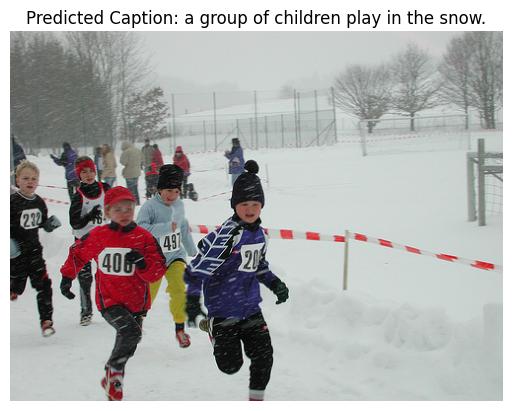

Ground Truth Captions:
1. A group of children run a footrace in the snow .
2. A group of young boys race on a snowy day .
3. School kids racing in the snow .
4. The children are running in the snow with fences in the background .
5. The young runners are racing through the snow .
BLEU Score: 0.5969
METEOR Score: 0.4896


In [41]:
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import single_meteor_score

# For ground truth and evaluation metrices [single image]
def display_caption(image_path, captions_file):
    encoder, decoder = load_models()
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        features = encoder(image_tensor)
        predicted_ids = decoder.beam_search(features)
        predicted_caption = tokenizer.decode(predicted_ids, skip_special_tokens=True)

    captions_dict = load_captions(captions_file)
    image_id = image_path.split('\\')[-1]
    ground_truth_captions = captions_dict.get(image_id, [])
    
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted Caption: {predicted_caption}")
    plt.show()

    print("Ground Truth Captions:")
    for idx, caption in enumerate(ground_truth_captions, start=1):
        print(f"{idx}. {caption}")

    # Tokenization
    predicted_tokens = nltk.word_tokenize(predicted_caption.lower())
    reference_tokens_list = [nltk.word_tokenize(ref.lower()) for ref in ground_truth_captions]

    # Compute BLEU score
    bleu_score = sentence_bleu(reference_tokens_list, predicted_tokens, smoothing_function=SmoothingFunction().method1)

    # Compute METEOR score
    meteor_scores = [single_meteor_score(ref, predicted_tokens) for ref in reference_tokens_list]
    meteor_score = np.mean(meteor_scores)

    print(f"BLEU Score: {bleu_score:.4f}")
    print(f"METEOR Score: {meteor_score:.4f}")

# Example paths
image_path = r"D:\New folder\Flicker8k\Images\72218201_e0e9c7d65b.jpg"
captions_file = r"D:\New folder\Flicker8k\Flickr8k.token.txt"
display_caption(image_path, captions_file)


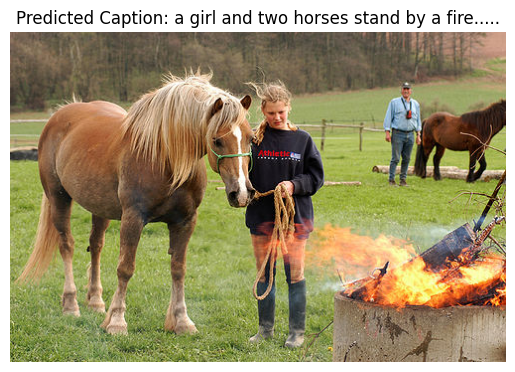

Ground Truth Captions for image: a girl and two horses stand by a fire.....
1. A blonde horse and a blonde girl in a black sweatshirt are staring at a fire in a barrel .
2. A girl and her horse stand by a fire .
3. A girl holding a horse 's lead behind a fire .
4. A man , and girl and two horses are near a contained fire .
5. Two people and two horses watching a fire .


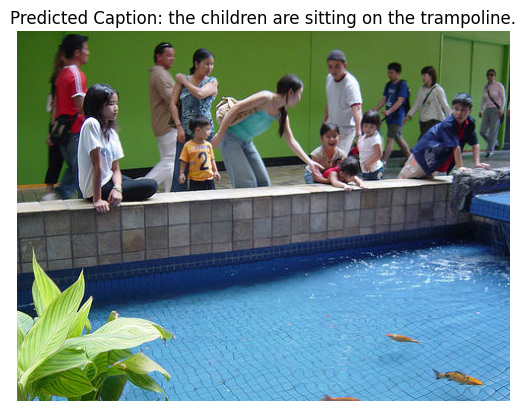

Ground Truth Captions for image: the children are sitting on the trampoline.
1. Children sit and watch the fish moving in the pond
2. people stare at the orange fish .
3. Several people are standing near a fish pond .
4. Some children watching fish in a pool .
5. There are several people and children looking into water with a blue tiled floor and goldfish .


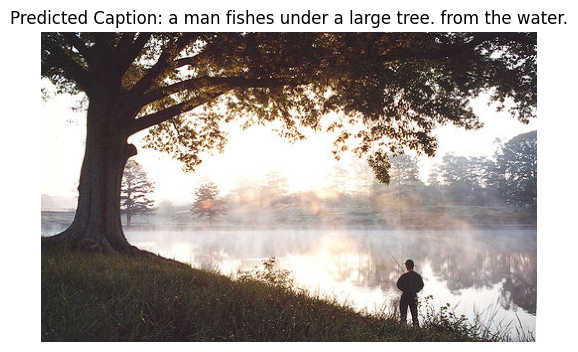

Ground Truth Captions for image: a man fishes under a large tree. from the water.
1. A fisherman fishes at the bank of a foggy river .
2. A man fishes by a tree in the morning mist .
3. A man fishes under a large tree .
4. A man fishing near a large tree .
5. A man is fishing in a foggy lake .


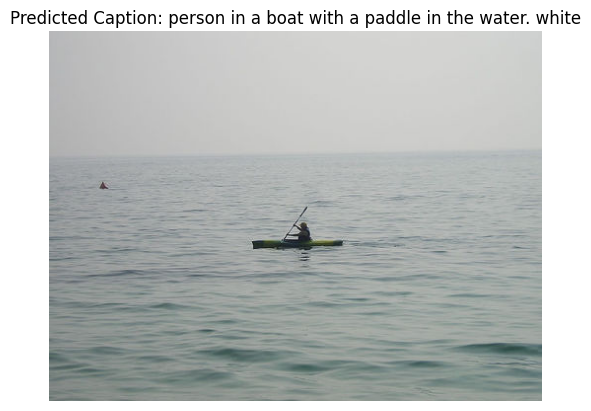

Ground Truth Captions for image: person in a boat with a paddle in the water. white
1. a kayaker kayaks through the water .
2. A person kayaking in the ocean .
3. A person kayaks in the middle of the ocean on a grey day .
4. A person rows a boat over a large body of water .
5. person in a boat with a paddle in hand


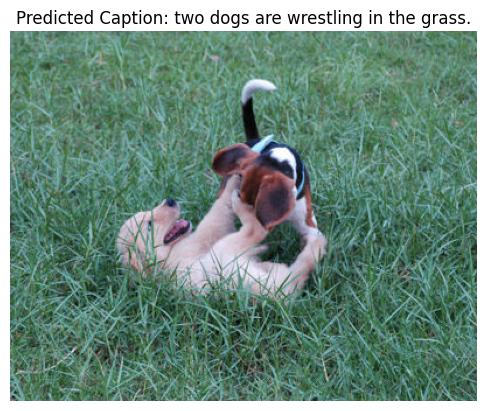

Ground Truth Captions for image: two dogs are wrestling in the grass.
1. a beagle and a golden retriever wrestling in the grass
2. Two dogs are wrestling in the grass .
3. Two puppies are playing in the green grass .
4. two puppies playing around in the grass
5. Two puppies play in the grass


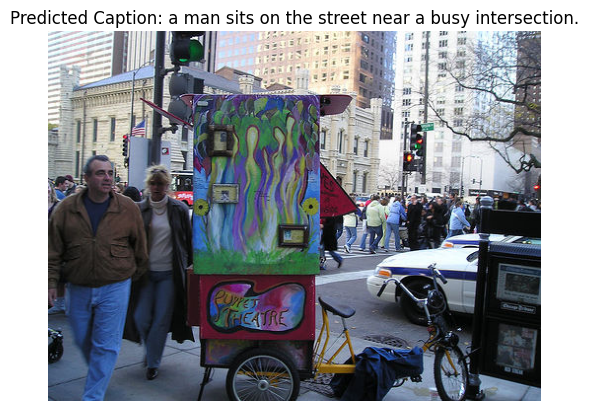

Ground Truth Captions for image: a man sits on the street near a busy intersection.
1. a brightly decorated bicycle with cart with people walking around in the background
2. A street vending machine is parked while people walk by .
3. A street vendor on the corner of a busy intersection .
4. People on the city street walk past a puppet theater .
5. People walk around a mobile puppet theater in a big city .


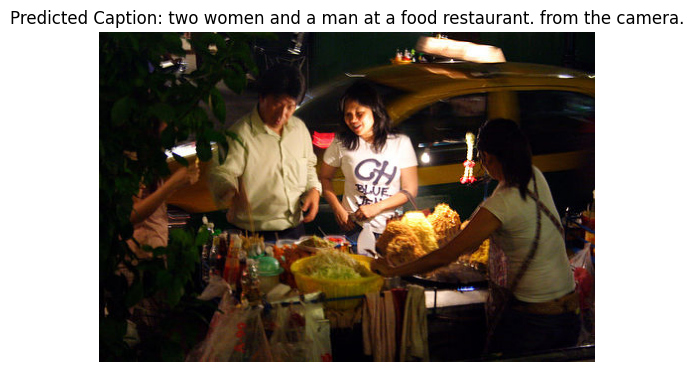

Ground Truth Captions for image: two women and a man at a food restaurant. from the camera.
1. A young couple inspect merchandise from a street vendor .
2. People are gathering around a table of food and outside a taxi wisks by .
3. Three people prepare a table full of food with a police car in the background .
4. two people look at a street vendor .
5. Two women and a man at a food counter in dim lights .


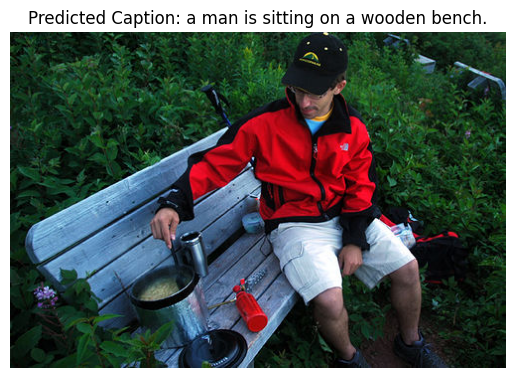

Ground Truth Captions for image: a man is sitting on a wooden bench.
1. A man in a red jacket is sitting on a bench whilst cooking a meal .
2. A man is sitting on a bench , cooking some food .
3. A man sits on a bench .
4. A man wearing a red jacket is sitting on a wooden bench and is cooking something in a small pot .
5. a man wearing a red jacket sitting on a bench next to various camping items


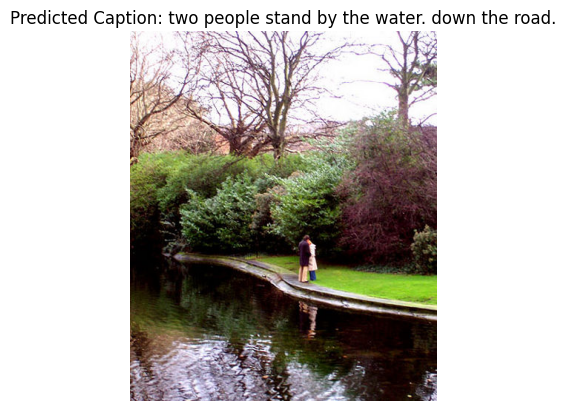

Ground Truth Captions for image: two people stand by the water. down the road.
1. A couple stands close at the water 's edge .
2. The two people stand by a body of water and in front of bushes in fall .
3. Two people hold each other near a pond .
4. Two people stand by the water .
5. Two people stand together on the edge of the water on the grass .


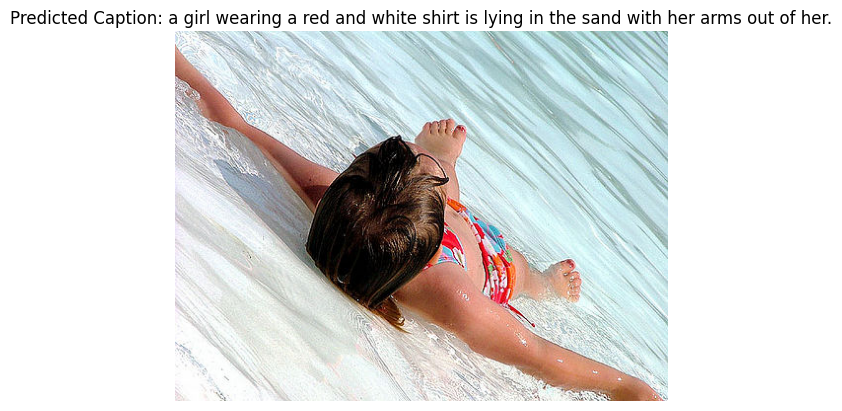

Ground Truth Captions for image: a girl wearing a red and white shirt is lying in the sand with her arms out of her.
1. A girl is stretched out in shallow water
2. A girl wearing a red and multi-colored bikini is laying on her back in shallow water .
3. A little girl in a red swimsuit is laying on her back in shallow water .
4. A young girl is lying in the sand , while ocean water is surrounding her .
5. Girl wearing a bikini lying on her back in a shallow pool of clear blue water .


In [42]:
import os

# Test in test dataset
def display_captions_from_folder(folder_path, captions_file):
    encoder, decoder = load_models()
    captions_dict = load_captions(captions_file)
    
   
    image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for image_path in image_files:
        image = Image.open(image_path).convert("RGB")
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])
        image_tensor = transform(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            features = encoder(image_tensor)
            predicted_ids = decoder.beam_search(features)
            predicted_caption = tokenizer.decode(predicted_ids, skip_special_tokens=True)
        
        image_id = os.path.basename(image_path)
        ground_truth_captions = captions_dict.get(image_id, [])
        
        plt.figure()
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted Caption: {predicted_caption}")
        plt.show()

        print("Ground Truth Captions for image:", predicted_caption)
        for idx, caption in enumerate(ground_truth_captions, start=1):
            print(f"{idx}. {caption}")


folder_path = r"D:\New folder\Flicker8k\limited"
captions_file = r"D:\New folder\Flicker8k\limited_cap.txt"
display_captions_from_folder(folder_path, captions_file)


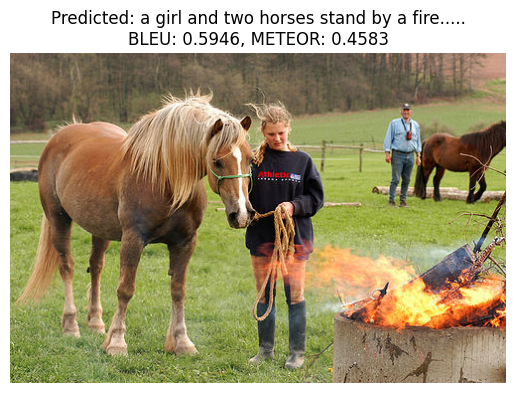

Ground Truth Captions for image: 10815824_2997e03d76.jpg
1. A blonde horse and a blonde girl in a black sweatshirt are staring at a fire in a barrel .
2. A girl and her horse stand by a fire .
3. A girl holding a horse 's lead behind a fire .
4. A man , and girl and two horses are near a contained fire .
5. Two people and two horses watching a fire .
BLEU Score: 0.5946
METEOR Score: 0.4583



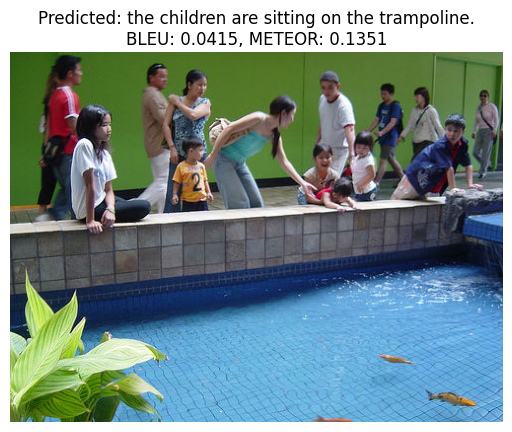

Ground Truth Captions for image: 12830823_87d2654e31.jpg
1. Children sit and watch the fish moving in the pond
2. people stare at the orange fish .
3. Several people are standing near a fish pond .
4. Some children watching fish in a pool .
5. There are several people and children looking into water with a blue tiled floor and goldfish .
BLEU Score: 0.0415
METEOR Score: 0.1351



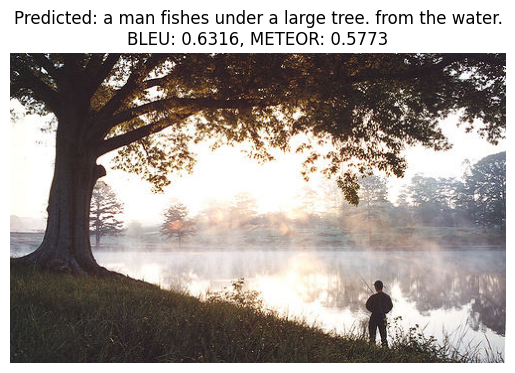

Ground Truth Captions for image: 17273391_55cfc7d3d4.jpg
1. A fisherman fishes at the bank of a foggy river .
2. A man fishes by a tree in the morning mist .
3. A man fishes under a large tree .
4. A man fishing near a large tree .
5. A man is fishing in a foggy lake .
BLEU Score: 0.6316
METEOR Score: 0.5773



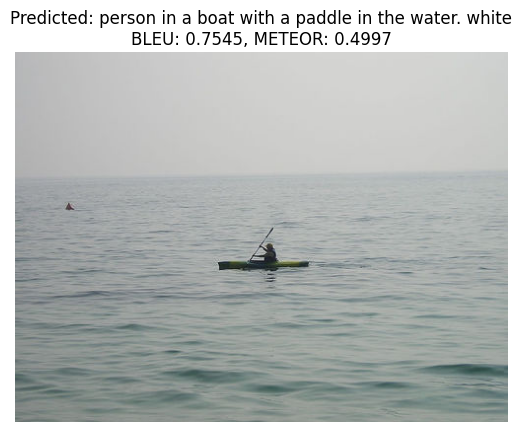

Ground Truth Captions for image: 19212715_20476497a3.jpg
1. a kayaker kayaks through the water .
2. A person kayaking in the ocean .
3. A person kayaks in the middle of the ocean on a grey day .
4. A person rows a boat over a large body of water .
5. person in a boat with a paddle in hand
BLEU Score: 0.7545
METEOR Score: 0.4997



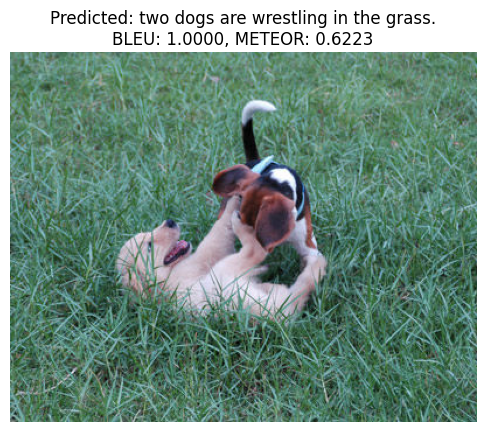

Ground Truth Captions for image: 23445819_3a458716c1.jpg
1. a beagle and a golden retriever wrestling in the grass
2. Two dogs are wrestling in the grass .
3. Two puppies are playing in the green grass .
4. two puppies playing around in the grass
5. Two puppies play in the grass
BLEU Score: 1.0000
METEOR Score: 0.6223



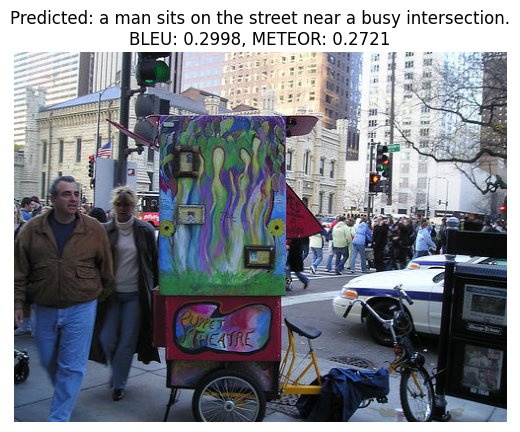

Ground Truth Captions for image: 27782020_4dab210360.jpg
1. a brightly decorated bicycle with cart with people walking around in the background
2. A street vending machine is parked while people walk by .
3. A street vendor on the corner of a busy intersection .
4. People on the city street walk past a puppet theater .
5. People walk around a mobile puppet theater in a big city .
BLEU Score: 0.2998
METEOR Score: 0.2721



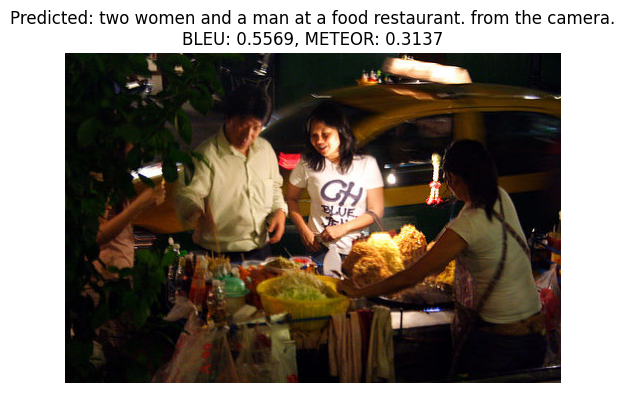

Ground Truth Captions for image: 33108590_d685bfe51c.jpg
1. A young couple inspect merchandise from a street vendor .
2. People are gathering around a table of food and outside a taxi wisks by .
3. Three people prepare a table full of food with a police car in the background .
4. two people look at a street vendor .
5. Two women and a man at a food counter in dim lights .
BLEU Score: 0.5569
METEOR Score: 0.3137



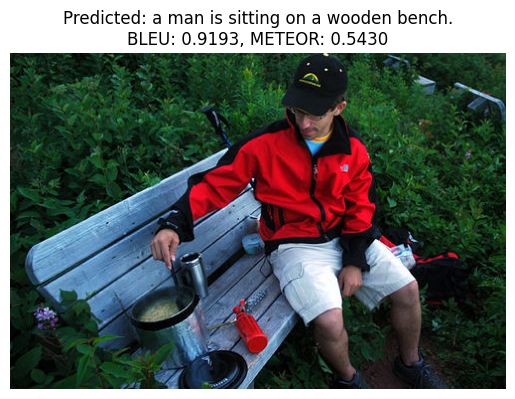

Ground Truth Captions for image: 35506150_cbdb630f4f.jpg
1. A man in a red jacket is sitting on a bench whilst cooking a meal .
2. A man is sitting on a bench , cooking some food .
3. A man sits on a bench .
4. A man wearing a red jacket is sitting on a wooden bench and is cooking something in a small pot .
5. a man wearing a red jacket sitting on a bench next to various camping items
BLEU Score: 0.9193
METEOR Score: 0.5430



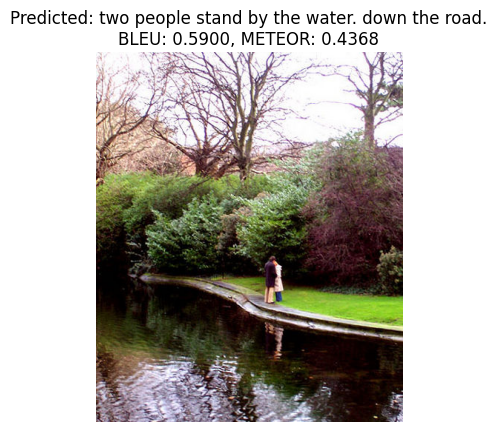

Ground Truth Captions for image: 3637013_c675de7705.jpg
1. A couple stands close at the water 's edge .
2. The two people stand by a body of water and in front of bushes in fall .
3. Two people hold each other near a pond .
4. Two people stand by the water .
5. Two people stand together on the edge of the water on the grass .
BLEU Score: 0.5900
METEOR Score: 0.4368



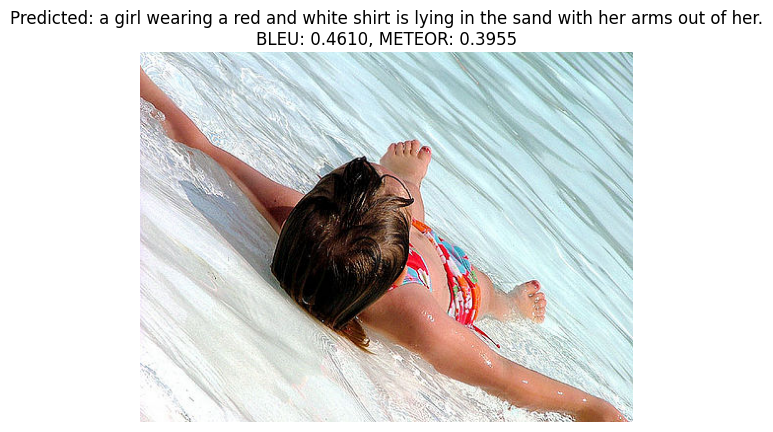

Ground Truth Captions for image: 667626_18933d713e.jpg
1. A girl is stretched out in shallow water
2. A girl wearing a red and multi-colored bikini is laying on her back in shallow water .
3. A little girl in a red swimsuit is laying on her back in shallow water .
4. A young girl is lying in the sand , while ocean water is surrounding her .
5. Girl wearing a bikini lying on her back in a shallow pool of clear blue water .
BLEU Score: 0.4610
METEOR Score: 0.3955



In [44]:
# Test dataset with evaluation metrices
def display_captions_from_folder(folder_path, captions_file):
    encoder, decoder = load_models()
    captions_dict = load_captions(captions_file)
    
    # List all image files in the folder
    image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for image_path in image_files:
        image = Image.open(image_path).convert("RGB")
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])
        image_tensor = transform(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            features = encoder(image_tensor)
            predicted_ids = decoder.beam_search(features)
            predicted_caption = tokenizer.decode(predicted_ids, skip_special_tokens=True)
        
        image_id = os.path.basename(image_path)
        ground_truth_captions = captions_dict.get(image_id, [])
        
        # Tokenization
        predicted_tokens = nltk.word_tokenize(predicted_caption.lower())
        reference_tokens_list = [nltk.word_tokenize(ref.lower()) for ref in ground_truth_captions]

        # Compute BLEU score
        bleu_score = sentence_bleu(reference_tokens_list, predicted_tokens, smoothing_function=SmoothingFunction().method1)

        # Compute METEOR score
        meteor_scores = [single_meteor_score(ref, predicted_tokens) for ref in reference_tokens_list]
        meteor_score = np.mean(meteor_scores)

        plt.figure()
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted: {predicted_caption}\nBLEU: {bleu_score:.4f}, METEOR: {meteor_score:.4f}")
        plt.show()

        print("Ground Truth Captions for image:", image_id)
        for idx, caption in enumerate(ground_truth_captions, start=1):
            print(f"{idx}. {caption}")
        print(f"BLEU Score: {bleu_score:.4f}")
        print(f"METEOR Score: {meteor_score:.4f}\n")

# Example paths
folder_path = r"D:\New folder\Flicker8k\limited"
captions_file = r"D:\New folder\Flicker8k\limited_cap.txt"
display_captions_from_folder(folder_path, captions_file)


In [47]:
import os
import nltk
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import single_meteor_score

# Ensure that necessary NLTK data is downloaded
nltk.download('wordnet')
nltk.download('punkt')

def display_captions_from_folder(folder_path, captions_file, save_path):
    encoder, decoder = load_models()
    captions_dict = load_captions(captions_file)
    
    # List all image files in the folder
    image_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

    total_bleu_score = 0
    total_meteor_score = 0
    num_images = 0
    
    for image_path in image_files:
        image = Image.open(image_path).convert("RGB")
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        ])
        image_tensor = transform(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            features = encoder(image_tensor)
            predicted_ids = decoder.beam_search(features)
            predicted_caption = tokenizer.decode(predicted_ids, skip_special_tokens=True)
        
        image_id = os.path.basename(image_path)
        ground_truth_captions = captions_dict.get(image_id, [])
        
        # Tokenization
        predicted_tokens = nltk.word_tokenize(predicted_caption.lower())
        reference_tokens_list = [nltk.word_tokenize(ref.lower()) for ref in ground_truth_captions]

        # Compute BLEU score
        bleu_score = sentence_bleu(reference_tokens_list, predicted_tokens, smoothing_function=SmoothingFunction().method1)
        total_bleu_score += bleu_score

        # Compute METEOR score
        meteor_scores = [single_meteor_score(ref, predicted_tokens) for ref in reference_tokens_list]
        meteor_score = np.mean(meteor_scores)
        total_meteor_score += meteor_score

        num_images += 1

        plt.figure(figsize=(10, 8))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted: {predicted_caption}\nBLEU: {bleu_score:.4f}, METEOR: {meteor_score:.4f}")
        
        # Define the save path for each image
        save_filename = os.path.join(save_path, f"{os.path.splitext(image_id)[0]}_captioned.png")
        plt.savefig(save_filename, bbox_inches='tight')
        plt.close()  # Close the figure to avoid displaying it in the notebook

        print(f"Saved image with caption to {save_filename}")
        print("Ground Truth Captions for image:", image_id)
        for idx, caption in enumerate(ground_truth_captions, start=1):
            print(f"{idx}. {caption}")
        print(f"BLEU Score: {bleu_score:.4f}")
        print(f"METEOR Score: {meteor_score:.4f}\n")

    # Calculate average scores
    average_bleu = total_bleu_score / num_images if num_images > 0 else 0
    average_meteor = total_meteor_score / num_images if num_images > 0 else 0
    print(f"Average BLEU Score: {average_bleu:.4f}")
    print(f"Average METEOR Score: {average_meteor:.4f}")

# Example paths
folder_path = r"D:\New folder\Flicker8k\limited"
captions_file = r"D:\New folder\Flicker8k\limited_cap.txt"
save_path = r"D:\New folder\Flicker8k\captioned_images"
os.makedirs(save_path, exist_ok=True)  # Create the save directory if it doesn't exist
display_captions_from_folder(folder_path, captions_file, save_path)


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Adnan\anaconda3\envs\dl_env\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Adnan\anaconda3\envs\dl_env\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Saved image with caption to D:\New folder\Flicker8k\captioned_images\10815824_2997e03d76_captioned.png
Ground Truth Captions for image: 10815824_2997e03d76.jpg
1. A blonde horse and a blonde girl in a black sweatshirt are staring at a fire in a barrel .
2. A girl and her horse stand by a fire .
3. A girl holding a horse 's lead behind a fire .
4. A man , and girl and two horses are near a contained fire .
5. Two people and two horses watching a fire .
BLEU Score: 0.5946
METEOR Score: 0.4583

Saved image with caption to D:\New folder\Flicker8k\captioned_images\12830823_87d2654e31_captioned.png
Ground Truth Captions for image: 12830823_87d2654e31.jpg
1. Children sit and watch the fish moving in the pond
2. people stare at the orange fish .
3. Several people are standing near a fish pond .
4. Some children watching fish in a pool .
5. There are several people and children looking into water with a blue tiled floor and goldfish .
BLEU Score: 0.0415
METEOR Score: 0.1351

Saved image with ca